## Importing libraries

In [1]:
import  pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, 
                            f1_score, 
                            precision_score, 
                            recall_score, 
                            classification_report,
                            confusion_matrix
                            )
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.svm import SVC

## Load the dataset

In [2]:
data = pd.read_csv('water_potability.csv')

In [3]:
#Prints first five column of the data
data.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [4]:
#Prints last five column of the data
data.tail()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1
3275,7.874671,195.102299,17404.177061,7.509306,NaN,327.459760,16.140368,78.698446,2.309149,1


In [5]:
#Counts the no. of rows and columns
data.shape

(3276, 10)

Water Quality Dataset has 3276 number of rows and 10 columns.

In [6]:
data['Potability'].value_counts()

Potability
0    1998
1    1278
Name: count, dtype: int64

Dataset contains 1998 rows that represents potentially 0 indicating non-potable water and 1278 rows that represents 1 indicating potable water.

In [7]:
#Prnts the summary of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [8]:
#Checking missing values
data.isna().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

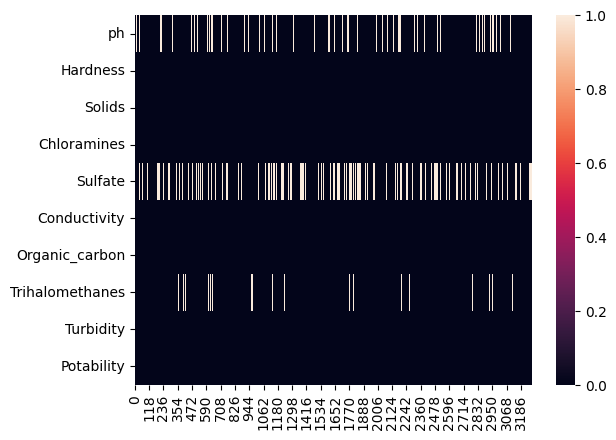

In [9]:
#missing data in percentage for each column
sns.heatmap(data.isna().transpose())
plt.show()

In [10]:
data.isna().sum()/len(data)*100

ph                 14.987790
Hardness            0.000000
Solids              0.000000
Chloramines         0.000000
Sulfate            23.840049
Conductivity        0.000000
Organic_carbon      0.000000
Trihalomethanes     4.945055
Turbidity           0.000000
Potability          0.000000
dtype: float64

## Data Preprocessing

In [12]:
#Imputing the rows in which glucose value is null by the mean value of glucose from that column.
data['ph'].fillna(data['ph'].mean())

0       7.080795
1       3.716080
2       8.099124
3       8.316766
4       9.092223
          ...   
3271    4.668102
3272    7.808856
3273    9.419510
3274    5.126763
3275    7.874671
Name: ph, Length: 3276, dtype: float64

In [13]:
data['Sulfate'].fillna(data['Sulfate'].mean())

0       368.516441
1       333.775777
2       333.775777
3       356.886136
4       310.135738
           ...    
3271    359.948574
3272    333.775777
3273    333.775777
3274    333.775777
3275    333.775777
Name: Sulfate, Length: 3276, dtype: float64

In [15]:
data['Trihalomethanes'].fillna(data['Trihalomethanes'].mean())

0        86.990970
1        56.329076
2        66.420093
3       100.341674
4        31.997993
           ...    
3271     66.687695
3272     66.396293
3273     69.845400
3274     77.488213
3275     78.698446
Name: Trihalomethanes, Length: 3276, dtype: float64

In [16]:
#Data has been cleaned and all the values have been imputed
data.isna().sum()

ph                   0
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes      0
Turbidity            0
Potability           0
dtype: int64

In [17]:
#Summary of the dataset after missing values
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [18]:
#Calculating statistical data
data.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,3276.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.469956,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,15.769881,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.277673,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,56.647656,3.439711,0.000000
50%,7.080795,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.396293,3.955028,0.000000
75%,7.870050,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,76.666609,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


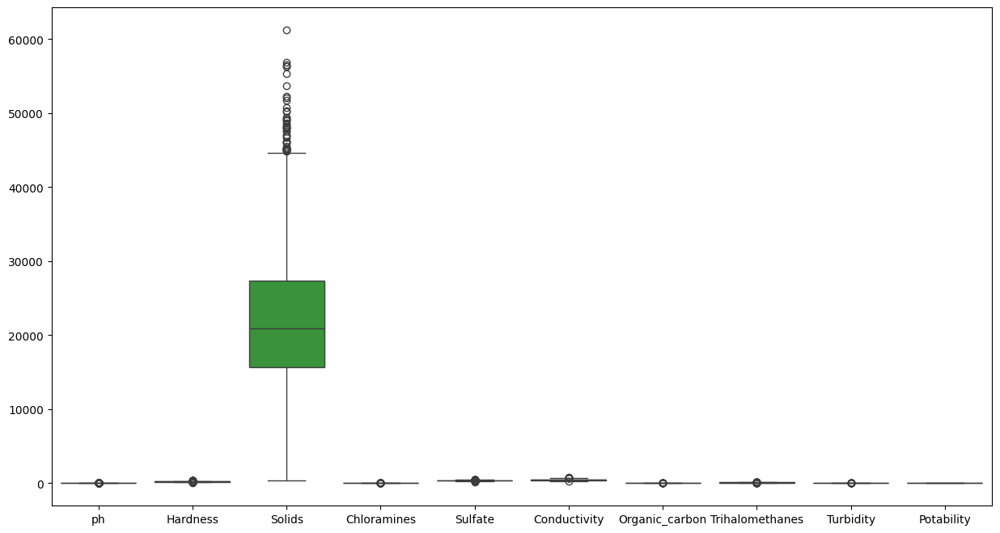

In [19]:
#Box plotting ro analyze outliers
plt.figure(figsize = (15, 8))
sns.boxplot(data = data)
plt.show()

We can observe outlilers as shown above in different columns.

In [20]:
#Removing outliers
for col in data.columns:
    if col not in ['Potability']:
        data = data[data[col] < data[col].quantile(0.99)]
        data = data[data[col] > data[col].quantile(0.01)]

In [21]:
# Changed statistical data after removing outliers
data.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2080.000000,2080.000000,2080.000000,2080.000000,2080.000000,2080.000000,2080.000000,2080.000000,2080.000000,2080.000000
mean,7.069866,196.249728,21891.554314,7.106227,334.170668,425.296110,14.391578,66.246560,3.972559,0.380288
std,1.319343,29.333248,7957.866238,1.424468,36.950118,76.504616,3.063129,14.689581,0.730258,0.485574
min,3.445062,114.807578,5576.628297,3.271144,235.770982,269.449051,6.306055,28.878601,2.174898,0.000000
25%,6.309135,177.875808,15832.702192,6.177988,309.238401,367.614947,12.251716,56.788042,3.444882,0.000000
50%,7.080795,197.103467,20990.355544,7.114169,333.073455,421.380544,14.318116,66.396293,3.962210,0.000000
75%,7.814674,215.313824,27049.963941,8.041765,358.962079,479.966784,16.631082,76.176183,4.501133,1.000000
max,10.811290,277.065713,45166.639389,10.896663,427.377802,616.121340,21.917377,105.165799,5.776611,1.000000


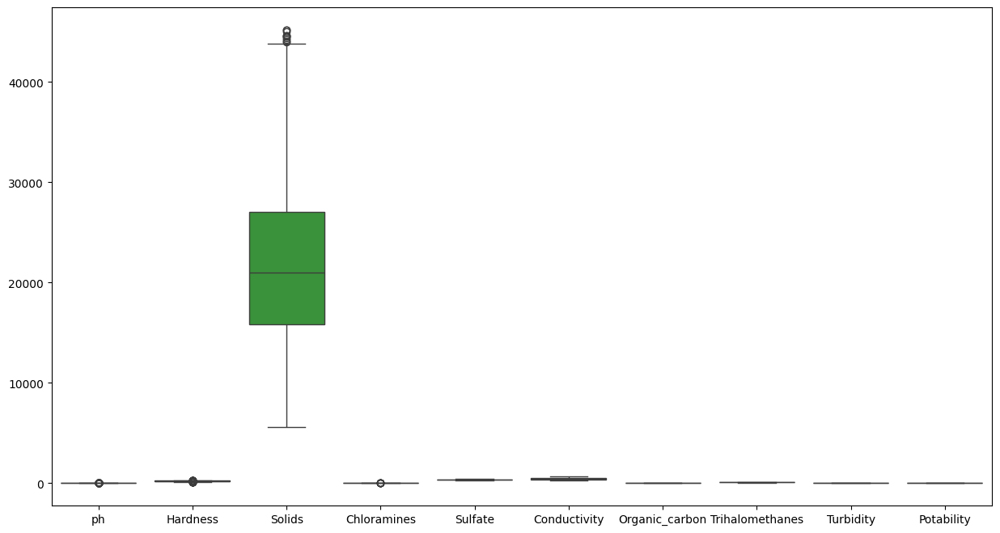

In [22]:
# Display in boxplot 
plt.figure(figsize = (15, 8))
sns.boxplot(data = data)
plt.show()

After analyzing the boxplot, it can be observed that the removal of the outliers has resulted.

In [23]:
#Statistical summary after removing outliers
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2080 entries, 0 to 3270
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2080 non-null   float64
 1   Hardness         2080 non-null   float64
 2   Solids           2080 non-null   float64
 3   Chloramines      2080 non-null   float64
 4   Sulfate          2080 non-null   float64
 5   Conductivity     2080 non-null   float64
 6   Organic_carbon   2080 non-null   float64
 7   Trihalomethanes  2080 non-null   float64
 8   Turbidity        2080 non-null   float64
 9   Potability       2080 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 178.8 KB


From the above summary, we can observe that now the dataset contains 2726 non-null values for each column. It is seen that the dataset is now clean and ready for analysis, with no missing values or outliers in any of the columns.

## Data Visualization

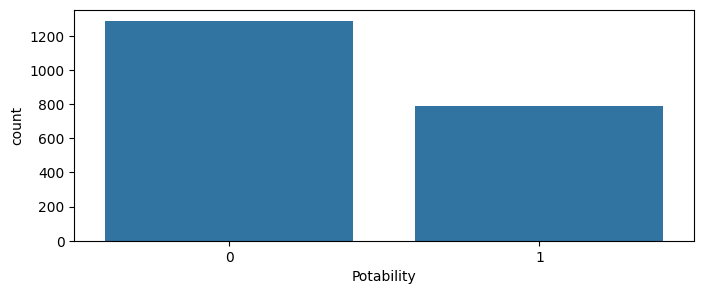

In [24]:
plt.figure(figsize = (8,3))
sns.countplot(x = 'Potability', data = data)
plt.show()

In [25]:
data['Potability'].value_counts()/len(data) *100

Potability
0    61.971154
1    38.028846
Name: count, dtype: float64

0 class has 61.99% and 1 class has 38% data. Clearly the given dataset is imbalanced.

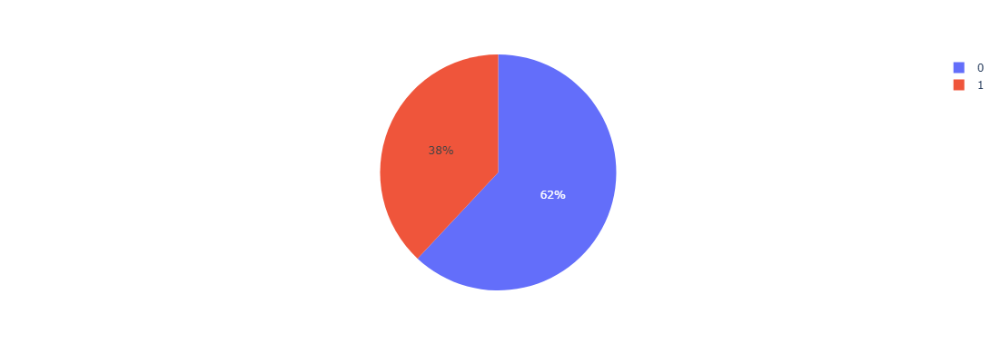

In [26]:
fig = px.pie(names = data['Potability'].value_counts().index, values = data['Potability'].value_counts().values)
fig.update_layout(width = 600, height = 400)

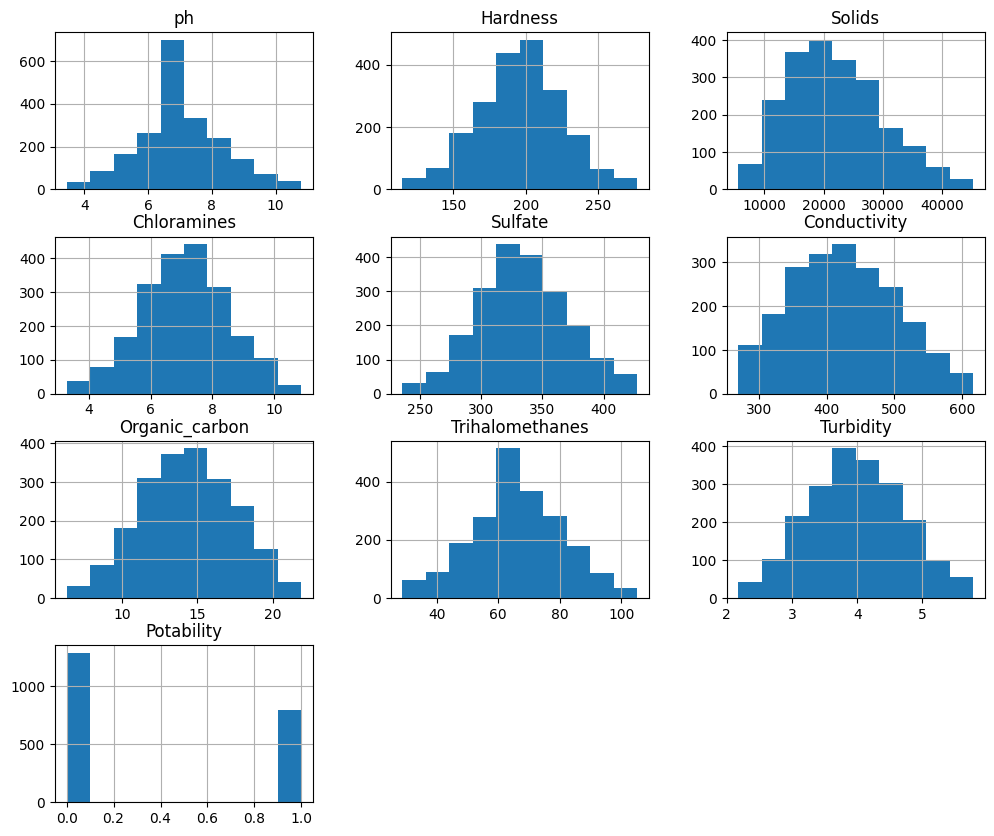

In [27]:
# Checking normality (how data is distributed) using histplot
data.hist(figsize = (12, 10), bins= 10)
plt.show()

Based on the histogram plot above, it is evident that all the input variables exhibit a normal distribution. There is no indication of any column being biased.

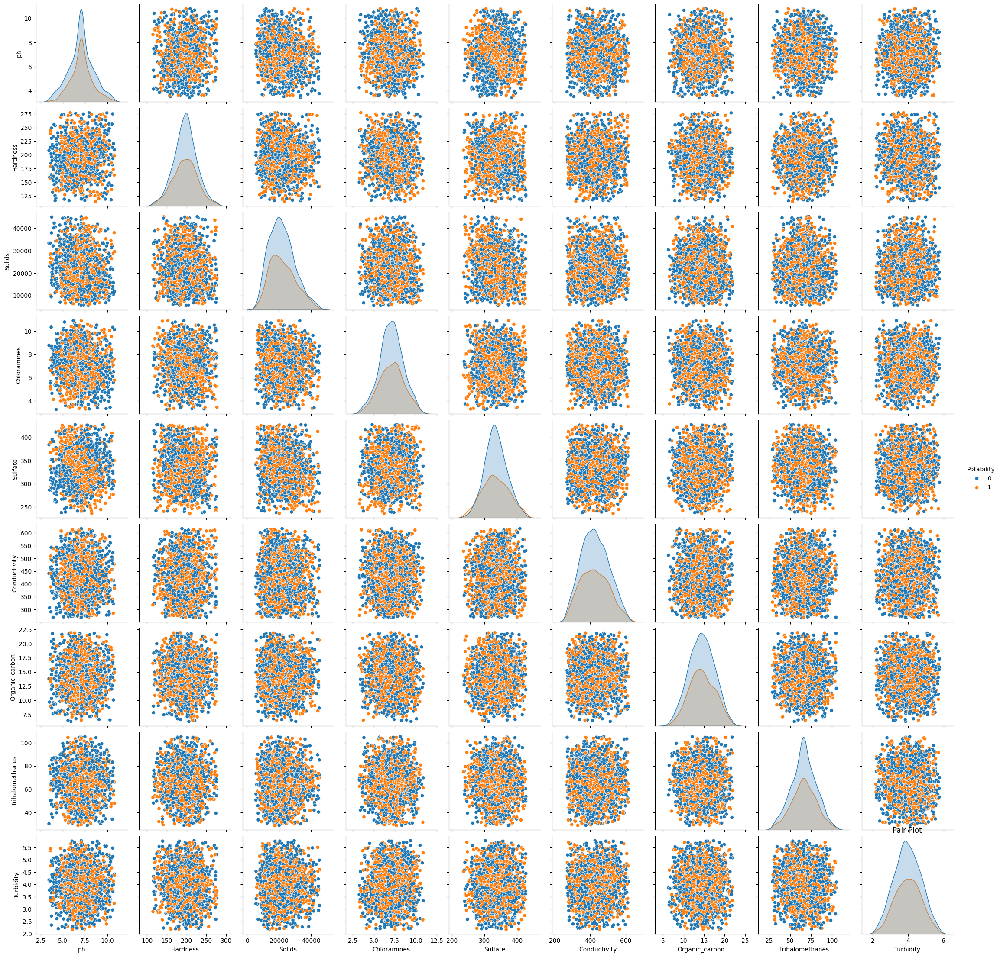

In [28]:
#Pairplot
sns.pairplot(data =data, hue='Potability')
plt.title('Pair Plot')
plt.show()

In [29]:
data.corr()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.128934,-0.087148,-0.056317,0.013541,0.000714,0.027270,0.017596,-0.028375,0.016502
Hardness,0.128934,1.000000,-0.046444,-0.023369,-0.071177,0.003748,-0.000280,-0.017039,-0.024208,-0.006301
Solids,-0.087148,-0.046444,1.000000,-0.045014,-0.142460,0.015358,0.022950,-0.019375,0.006331,0.036704
Chloramines,-0.056317,-0.023369,-0.045014,1.000000,0.043320,-0.026457,-0.014403,0.006068,0.002634,0.010561
Sulfate,0.013541,-0.071177,-0.142460,0.043320,1.000000,-0.012169,0.018725,-0.026009,-0.004969,-0.009265
Conductivity,0.000714,0.003748,0.015358,-0.026457,-0.012169,1.000000,0.000965,-0.010401,0.022127,-0.009428
Organic_carbon,0.027270,-0.000280,0.022950,-0.014403,0.018725,0.000965,1.000000,-0.021671,-0.004706,0.019409
Trihalomethanes,0.017596,-0.017039,-0.019375,0.006068,-0.026009,-0.010401,-0.021671,1.000000,-0.020932,0.008323
Turbidity,-0.028375,-0.024208,0.006331,0.002634,-0.004969,0.022127,-0.004706,-0.020932,1.000000,0.018115
Potability,0.016502,-0.006301,0.036704,0.010561,-0.009265,-0.009428,0.019409,0.008323,0.018115,1.000000


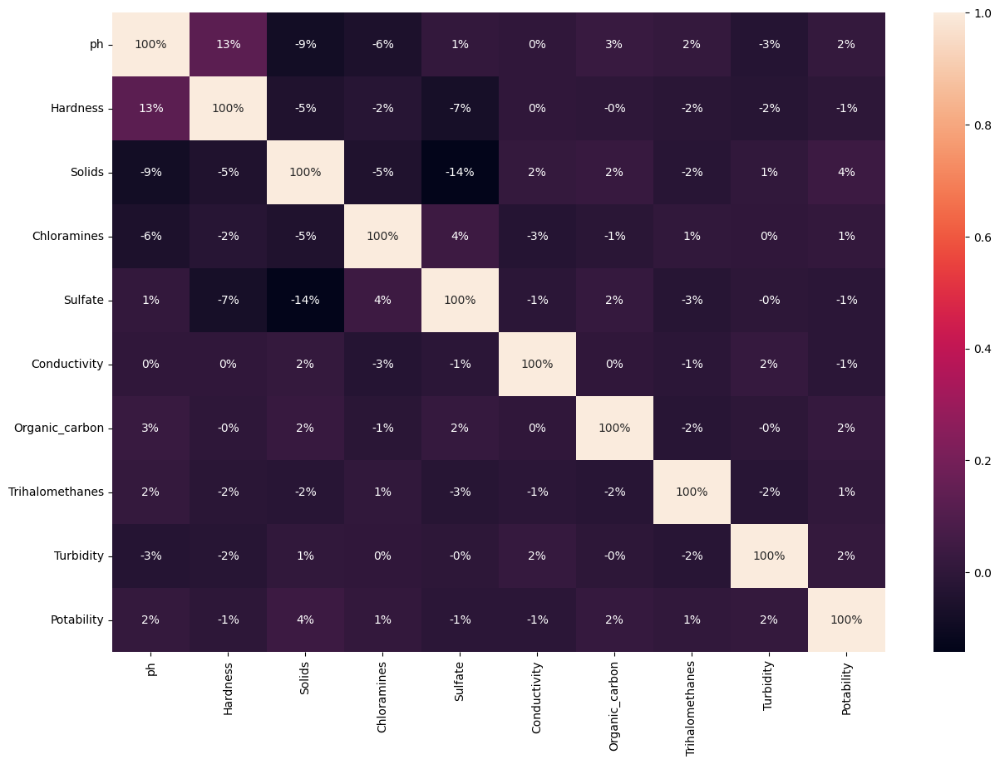

In [30]:
#Correlation heatmap
plt.figure(figsize =  (15, 10))
sns.heatmap(data = data.corr(), fmt = '.0%', annot = True)
plt.show()

Since columns 'Sulfate', 'Organic_carbon', 'Turbidity' have 0% correlation with Potability of water, it is safe to drop those columns

In [31]:
data = data.drop('Sulfate', axis = 1)

In [32]:
data = data.drop('Organic_carbon', axis = 1)

In [33]:
data = data.drop('Turbidity', axis = 1)

In [34]:
#Counts the no. of rows and columns after dropping columns
data.shape

(2080, 7)

In [35]:
# Displays the columns to list
data.columns.tolist()

['ph',
 'Hardness',
 'Solids',
 'Chloramines',
 'Conductivity',
 'Trihalomethanes',
 'Potability']

Splitting data

In [36]:
#Separating the data into features(X) and target(y) and printing their shape

X = data.iloc[:, 0:6] #independent variable
y = data.iloc[:, 6]  #dependent variable

print(X.shape)
print(y.shape)

(2080, 6)
(2080,)


In [37]:
X.head()

,ph,Hardness,Solids,Chloramines,Conductivity,Trihalomethanes
0,7.080795,204.890455,20791.318981,7.300212,564.308654,86.990970
3,8.316766,214.373394,22018.417441,8.059332,363.266516,100.341674
4,9.092223,181.101509,17978.986339,6.546600,398.410813,31.997993
5,5.584087,188.313324,28748.687739,7.544869,280.467916,54.917862
6,10.223862,248.071735,28749.716544,7.513408,283.651634,84.603556


In [38]:
y.head()

0    0
3    0
4    0
5    0
6    0
Name: Potability, dtype: int64

In [39]:
y.tail()

3264    1
3265    1
3267    1
3268    1
3270    1
Name: Potability, dtype: int64

Train-test Split

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state =40)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1664, 6)
(416, 6)
(1664,)
(416,)


In [41]:
X_train

,ph,Hardness,Solids,Chloramines,Conductivity,Trihalomethanes
791,6.376408,182.121038,33046.727606,5.351533,350.236326,66.225674
228,7.682872,180.701375,12105.721934,5.396716,469.835626,61.802095
3011,6.901111,154.474092,21103.303188,7.928700,450.252974,71.321372
2743,8.277058,242.559246,12715.814280,5.128733,561.761156,61.799014
893,9.055826,196.475899,20226.287945,5.838594,342.359411,84.279218
...,...,...,...,...,...,...
718,7.417503,198.705653,24389.362885,4.790681,366.370724,87.996223
993,8.347949,231.203101,13533.230033,7.623604,527.380871,58.052866
2933,7.080795,200.661925,29513.804860,7.966300,476.201585,66.396293
2085,7.080795,210.744708,12229.298484,6.950981,422.027072,77.322330


In [42]:
y_train

791     1
228     0
3011    0
2743    1
893     0
       ..
718     1
993     0
2933    0
2085    0
3233    1
Name: Potability, Length: 1664, dtype: int64

Trying two different models

1) Logistic Regression

2) SVM (Support Vector Machine)

In [43]:
#Logistic Regression

#Creating Logistic model and training it
log_model = LogisticRegression(max_iter=5000)  # without max_iter = ConvergenceWarning
log_model.fit(X_train, y_train)

#Making predictions on the test set
log_pred = log_model.predict(X_test)

In [44]:
# Confusion Matrix of Suppport Vector Machine

cm = confusion_matrix(y_true = y_test, y_pred = log_pred)
cm

array([[255,   0],
       [161,   0]], dtype=int64)

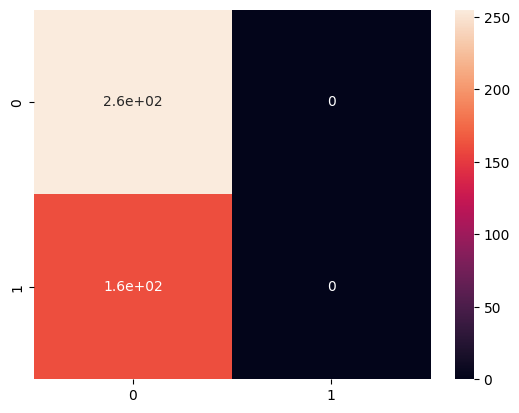

In [45]:
sns.heatmap(confusion_matrix(y_test, log_pred), annot=True)
plt.show()

In [46]:
print(classification_report(y_true = y_test, y_pred = log_pred))

              precision    recall  f1-score   support

           0       0.61      1.00      0.76       255
           1       0.00      0.00      0.00       161

    accuracy                           0.61       416
   macro avg       0.31      0.50      0.38       416
weighted avg       0.38      0.61      0.47       416



C:\Users\DELL\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [47]:
#SVM

#Creating SVM model and training it
svm_model = SVC()  
svm_model.fit(X_train, y_train)

#Making prediciton in the test set
svm_pred = svm_model.predict(X_test)

In [48]:
# Confusion Matrix of Suppport Vector Machine

cm = confusion_matrix(y_true = y_test, y_pred = svm_pred)
cm

array([[255,   0],
       [161,   0]], dtype=int64)

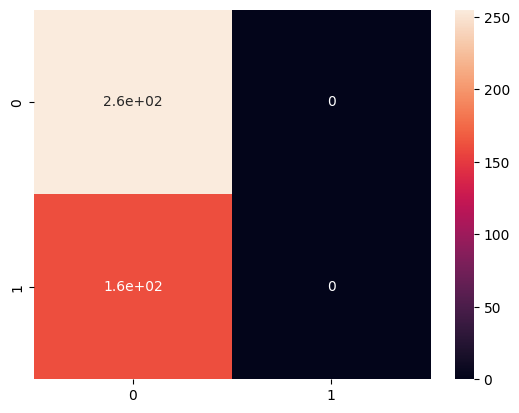

In [49]:
sns.heatmap(confusion_matrix(y_test, svm_pred), annot=True)
plt.show()

In [50]:
print(classification_report(y_true = y_test, y_pred = svm_pred))

              precision    recall  f1-score   support

           0       0.61      1.00      0.76       255
           1       0.00      0.00      0.00       161

    accuracy                           0.61       416
   macro avg       0.31      0.50      0.38       416
weighted avg       0.38      0.61      0.47       416



C:\Users\DELL\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\DELL\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



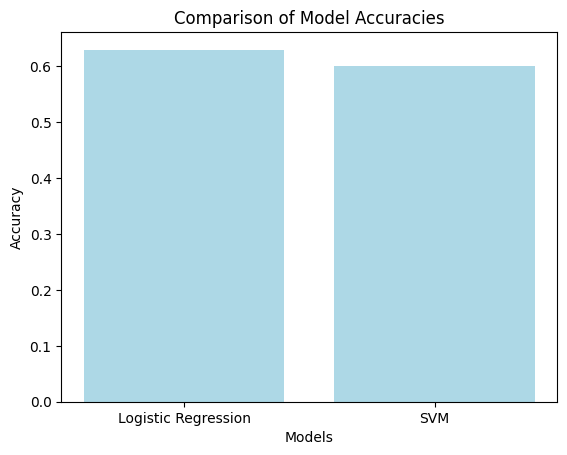

In [51]:
model_compare = ['Logistic Regression', 'SVM']
accuracies = [0.63, 0.60]

plt.bar(model_compare, accuracies, color='lightblue')

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Comparison of Model Accuracies')
plt.show()